# SVM и его ядра
__Суммарное количество баллов: 9__

__Мягкий дедлайн: `06.11.2020` | Жесткий дедлайн: `13.11.2020`__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ITMO][ML][MS][HW07] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

В этом задании нам предстоит решить задачу SVM при помощи `cvxopt` и применить ее к искуственным данным. Затем аналогичным способом нужно будет решить задачу ядерного SVM и исследовать его поведение для различных ядер и значений их параметров.

In [1]:
import numpy as np
import copy
from cvxopt import spmatrix, matrix, solvers
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification, make_moons, make_blobs
from typing import NoReturn, Callable
from scipy import linalg
solvers.options['show_progress'] = False

In [2]:
def visualize(clf, X, y):
    x_min, x_max = X[:, 0].min(), X[:, 0].max()
    y_min, y_max = X[:, 1].min(), X[:, 1].max()
    x_border = (x_max - x_min) / 20 + 1.0e-3
    x_h = (x_max - x_min + 2 * x_border) / 200
    y_border = (y_max - y_min) / 20 + 1.0e-3
    y_h = (y_max - y_min + 2 * y_border) / 200
    
    cm = plt.cm.Spectral

    xx, yy = np.meshgrid(np.arange(x_min - x_border, x_max + x_border, x_h), np.arange(y_min - y_border, y_max + y_border, y_h))
    mesh = np.c_[xx.ravel(), yy.ravel()]

    z_class = clf.predict(mesh).reshape(xx.shape)

    # Put the result into a color plot
    plt.figure(1, figsize=(8, 8))
    plt.pcolormesh(xx, yy, z_class, cmap=cm, alpha=0.3, shading='gouraud')

    # Plot hyperplane and margin
    z_dist = clf.decision_function(mesh).reshape(xx.shape)
    plt.contour(xx, yy, z_dist, [0.0], colors='black')
    plt.contour(xx, yy, z_dist, [-1.0, 1.0], colors='black', linestyles='dashed')

    # Plot also the training points
    y_pred = clf.predict(X)

    ind_support = []
    ind_correct = []
    ind_incorrect = []
    for i in range(len(y)):
        if i in clf.support:
            ind_support.append(i)
        elif y[i] == y_pred[i]:
            ind_correct.append(i)
        else:
            ind_incorrect.append(i)

    plt.scatter(X[ind_correct, 0], X[ind_correct, 1], c=y[ind_correct], cmap=cm, alpha=1., edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_incorrect, 0], X[ind_incorrect, 1], c=y[ind_incorrect], cmap=cm, alpha=1., marker='*',
               s=50, edgecolor='black', linewidth=.8)
    plt.scatter(X[ind_support, 0], X[ind_support, 1], c=y[ind_support], cmap=cm, alpha=1., edgecolor='yellow', linewidths=1.,
               s=40)

    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.tight_layout()

In [3]:
def generate_dataset(moons=False):
    if moons:
        X, y = make_moons(1000, noise=0.075, random_state=42)
        return X, 2 * y - 1
    X, y = make_blobs(1000, 2, centers=[[0, 0], [-4, 2], [3.5, -2.0], [3.5, 3.5]], random_state=42)
    y = 2 * (y % 2) - 1
    return X, y
    #return make_classification(1000, 2, 2, 0, flip_y=0.001, class_sep=1.2, scale=0.9, random_state=42)

X, y = generate_dataset(True)

### Задание 1 (2 балла)
Для начала реализуем обычный линейный SVM. 

#### Методы
`fit(X, y)` - обучает SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Поля
`support` - индексы опорных элементов

In [4]:
class LinearSVM:
    def __init__(self, C: float):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        
        """
        self.C = C
        self.support = None
        self.w = None
        self.b = None
        self.w1 = None
        self.b1 = None

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : np.ndarray
            Данные для обучения SVM.
        y : np.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        m,n = X.shape
        y = y.reshape(-1,1) * 1.
        H = np.dot(y * X , (y * X).T) * 1.
        P = matrix(H)
        q = matrix(-np.ones((m, 1)))
        G = matrix(np.vstack((np.eye(m)*-1,np.eye(m))))
        h = matrix(np.hstack((np.zeros(m), np.ones(m) * self.C)))
        A = matrix(y.reshape(1, -1))
        b = matrix(np.zeros(1))
        sol = solvers.qp(P, q, G, h, A, b)
        alphas = np.array(sol['x'])
        self.w = ((y * alphas).T @ X).reshape(-1,1)
        S = (alphas > 1e-4).flatten()
        self.b1 = np.mean(y[S] - np.dot(X[S], self.w))
        self.w1 = self.w.flatten()
        N = len(X)
        self.support = [i for i in range(N) if alphas[i] > 1e-3]

    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        np.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        return (np.dot(X, self.w1) + self.b1)

    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        np.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return np.sign(self.decision_function(X))

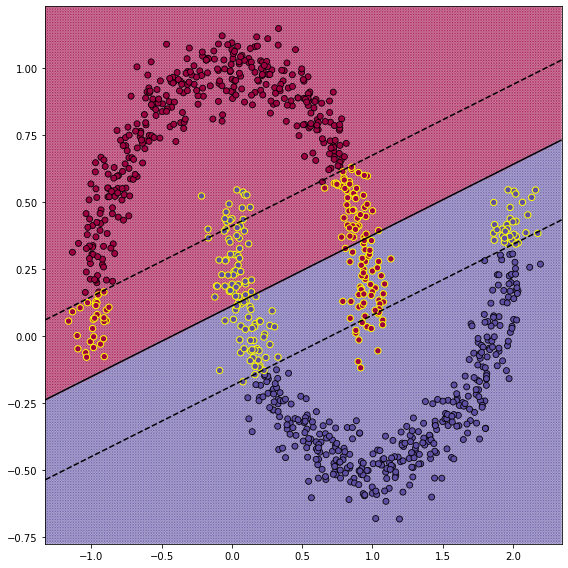

In [5]:
X, y = generate_dataset(True)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

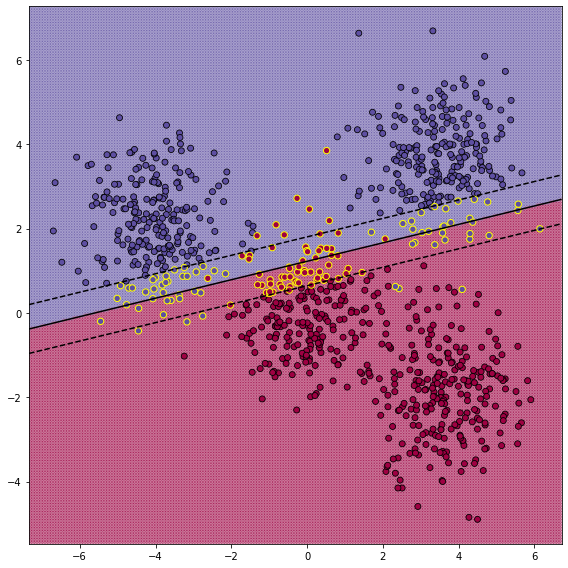

In [6]:
X, y = generate_dataset(False)
svm = LinearSVM(1)
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 2 (2 балла)
Перед реализацией ядерного SVM, реализуем функции, которые строят ядра.

#### Описание
`get_polynomial_kernel(power)` - возвращает полиномиальное ядро с заданной константой и степенью

`get_gaussian_kernel(sigma=1.)` - возвращает ядро Гаусса с заданным коэффицинтом сигма

In [7]:
def get_polynomial_kernel(c=1, power=2):
  return( lambda X, y: (c + np.dot(X.T, y)) ** power)
  "Возвращает полиномиальное ядро с заданной константой и степенью"

def get_gaussian_kernel(sigma=1.):
  return (lambda X, y:(np.exp(-linalg.norm(X-y)**2 / (2 * (sigma ** 2)))))
  "Возвращает ядро Гаусса с заданным коэффицинтом сигма"

### Задание 3 (2 балла)
Теперь перейдем к реализации самого kernel SVM.

#### Описание
`fit(X, y)` - обучает kernel SVM, решая задачу оптимизации при помощи `cvxopt.solvers.qp`

`decision_function(X)` - возвращает значение решающей функции (т.е. то число, от которого берем знак с целью узнать класс)

#### Конструктор
`kernel` - ядро-функция

In [32]:
class KernelSVM:
    def __init__(self, C: float, kernel: Callable):
        """
        
        Parameters
        ----------
        C : float
            Soft margin coefficient.
        kernel : Callable
            Функция ядра.
        
        """
        self.C = float(C)
        self.kernel = kernel
        self.support = None
        self.w = None
        self.b = 0

    def fit(self, X: np.ndarray, y: np.ndarray) -> NoReturn:
        """
        Обучает SVM, решая задачу оптимизации при помощи cvxopt.solvers.qp
        
        Parameters
        ----------
        X : np.ndarray
            Данные для обучения SVM.
        y : np.ndarray
            Бинарные метки классов для элементов X 
            (можно считать, что равны -1 или 1). 
        
        """
        n, m = X.shape
        K = np.zeros((n, n))
        for i in range(n):
            for j in range(n):
                K[i,j] = self.kernel(X[i], X[j])
        P = matrix(np.outer(y,y) * K)
        q = matrix(np.ones(n) * -1)
        A = matrix(y.astype('float'), (1,n))
        b = matrix(0.0)
        G = matrix(np.vstack((np.diag(np.ones(n) * -1), np.identity(n))))
        h = matrix(np.hstack((np.zeros(n), np.ones(n) * self.C)))
        solution = solvers.qp(P, q, G, h, A, b)
        alphas = np.ravel(solution['x'])
        self.support = np.arange(len(alphas))[alphas > 1e-5]
        self.alphas = alphas[alphas > 1e-5]
        self.sv = X[alphas > 1e-5]
        self.sv_y = y[alphas > 1e-5]
        for n in range(len(self.alphas)):
            self.b += self.sv_y[n]
            self.b -= np.sum(self.alphas * self.sv_y * K[self.support[n],alphas > 1e-5])
        self.b /= len(self.alphas)

    def decision_function(self, X: np.ndarray) -> np.ndarray:
        """
        Возвращает значение решающей функции.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, для которых нужно посчитать значение решающей функции.

        Return
        ------
        np.ndarray
            Значение решающей функции для каждого элемента X 
            (т.е. то число, от которого берем знак с целью узнать класс).     
        
        """
        #return np.dot(X, self.w) + self.b
        if self.w is not None:
            return np.dot(X, self.w) + self.b
        else:
            y_predict = np.zeros(len(X))
            for i in range(len(X)):
                s = 0
                for a, sv_y, sv in zip(self.alphas, self.sv_y, self.sv):
                    s += a * sv_y * self.kernel(X[i], sv)
                y_predict[i] = s
            return y_predict + self.b

    def predict(self, X: np.ndarray) -> np.ndarray:
        """
        Классифицирует элементы X.
        
        Parameters
        ----------
        X : np.ndarray
            Данные, которые нужно классифицировать

        Return
        ------
        np.ndarray
            Метка класса для каждого элемента X.   
        
        """
        return np.sign(self.decision_function(X))

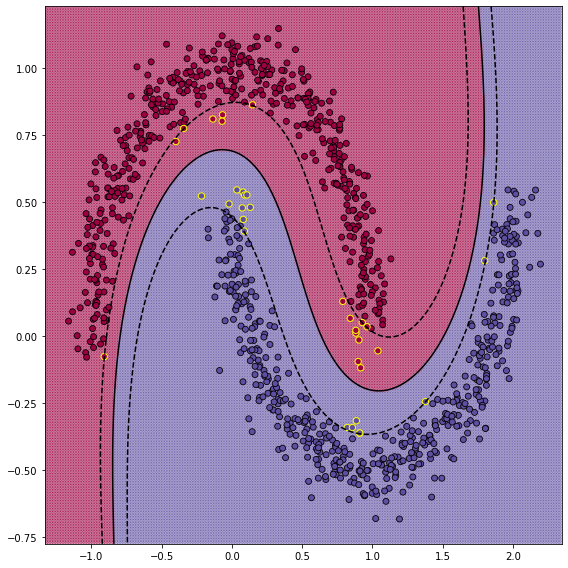

In [33]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

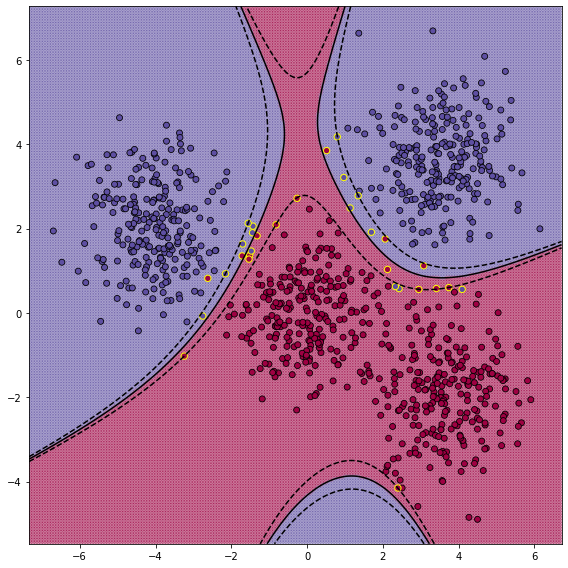

In [28]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

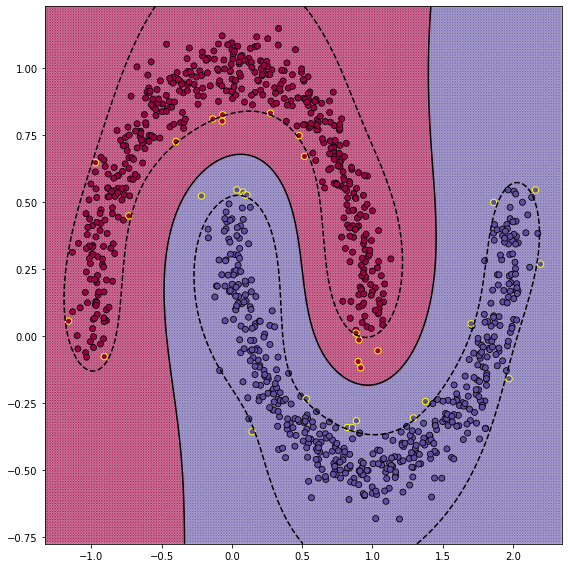

In [29]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

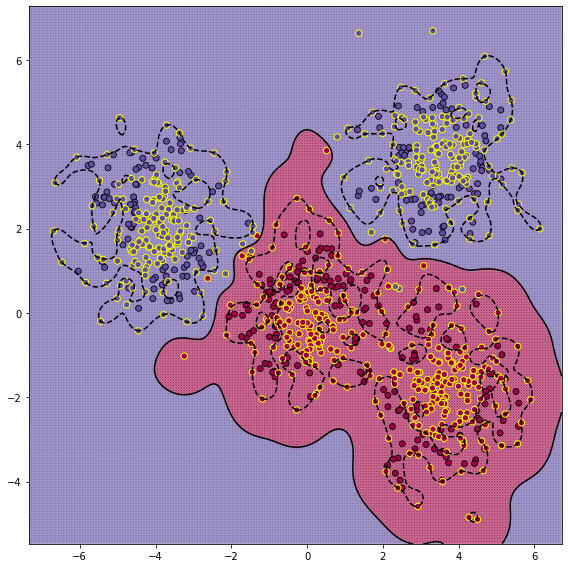

In [34]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.4))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

### Задание 4 (3 балла)
Исследуйте и опишите влияние параметров каждого вида ядра на полученный классификатор. Что происходит при увеличении константы в полиномиальном ядре? При увеличении степени? Как влияет на результат сигма в ядре Гаусса?

__При выполнении этого задания стоит написать код, который визуализирует классификаторы с различными ядрами__

В get_polynomial_kernel(power) более высокие степени power имеют тенденцию к переобучению. \\
Когда сумма в скобках < 1 K(x, y) стремится к нулю с увеличением power, когда сумма в скобках > 1 K(x, y) стремится к бесконечности с увеличением power. При тестировании на больших c и power классификатор либо работает неправильно (не совсем верно разделяет на классы), либо вообще выдает исключения и ошибки (ArithmeticError, ValueError). С увеличением power классификатор начинает работать плохо довольно быстро (при power = 20 уже совсем плохо), а c можно увеличить гораздо сильнее (работало при 10000). \\
В get_gaussian_kernel(sigma) при высоких sigma ядро постепенно сводится к постоянной функции и такие sigma препятствуют классификатору обнаруживать образцы, не принадлежащие к классу. С другой стороны, маленькие sigma приводят к переобучению, т.е. классификатор теряет способность распознавать образцы за пределами обучающей последовательности. \\
Для меня (1, 3) и (0.4) показались самыми оптимальными параметрами (по крайней мере, для данного способа генерации датасетов). \\
Слишком маленькие или слишком большие sigma, большие c и power приводят к более долгому обучению.

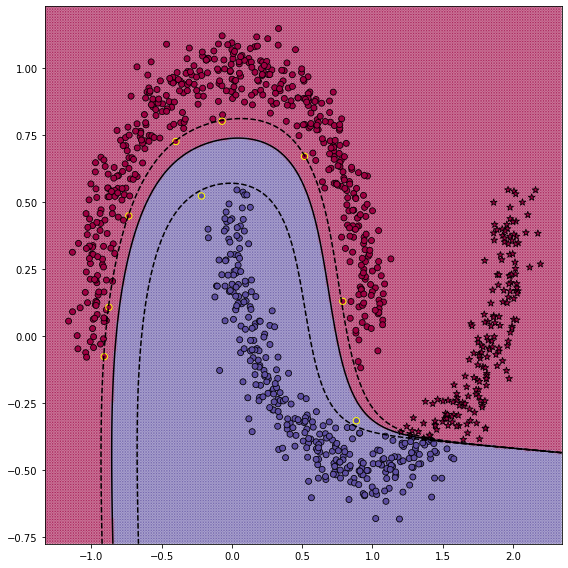

In [47]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 15))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

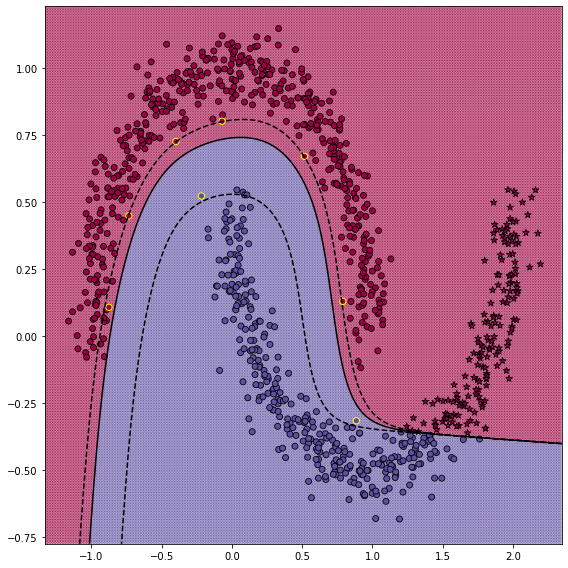

In [57]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 19))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

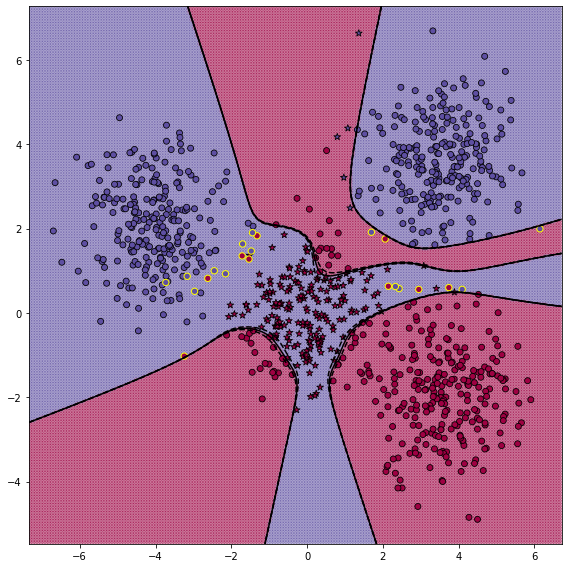

In [73]:
X, y = generate_dataset(False)
svm = KernelSVM(1, kernel=get_polynomial_kernel(1, 7))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

In [58]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(10, 100))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

ValueError: ignored

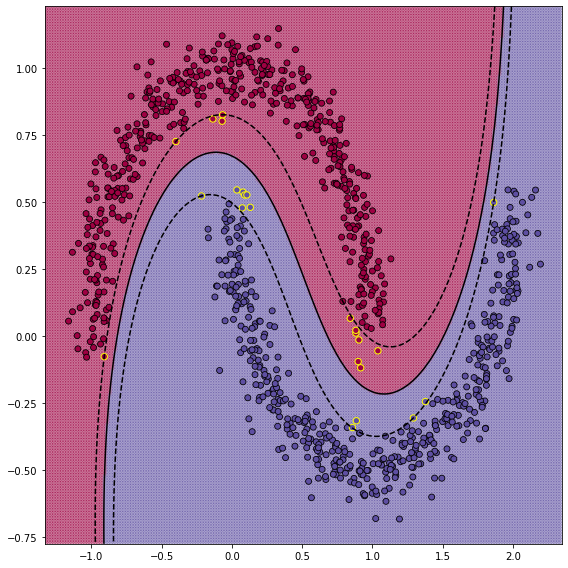

In [62]:
svm = KernelSVM(1, kernel=get_polynomial_kernel(10000, 3))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

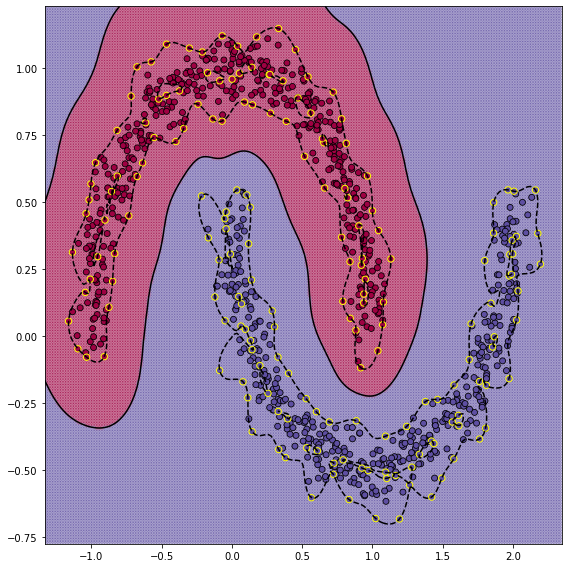

In [75]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.1))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

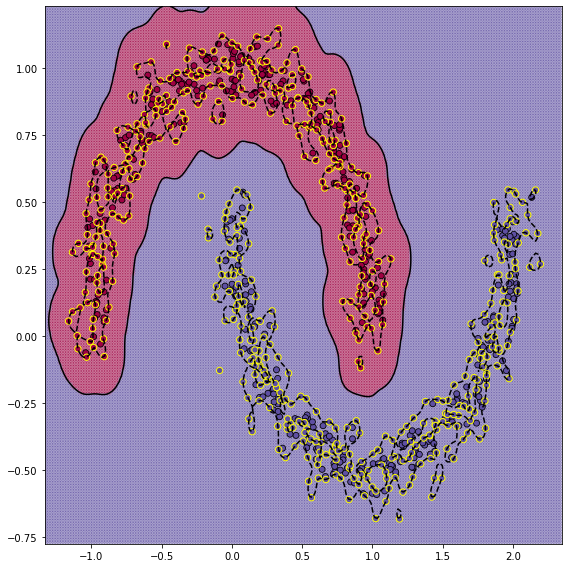

In [77]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.05))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

In [ ]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(10))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()

In [ ]:
X, y = generate_dataset(True)
svm = KernelSVM(1, kernel=get_gaussian_kernel(0.0001))
svm.fit(X, y)
visualize(svm, X, y)
plt.show()